[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/AI4EPS/DAS_Seismology_Workshop/blob/main/notebooks/lab2_phasenet_das/Notebooks/lab2b_phase_association.ipynb)

# Lab 2b: Phase Association

In this lab, you will learn how to group raw P and S picks into seismic events:
- Pair P and S arrivals per DAS channel
- Estimate earthquake origin times from P-S differential times
- Use histogram-based clustering to detect events
- Use RANSAC moveout fitting to improve association quality
- Tune association parameters interactively

**References:**
- Zhu, W. et al. (2022). Earthquake phase association using a Bayesian Gaussian mixture model. *JGR: Solid Earth*, 127(5), e2021JB023249.
- Zhu, W. et al. (2025a). Towards end-to-end earthquake monitoring using a multitask deep learning model. [arXiv:2506.06939](https://arxiv.org/abs/2506.06939)
- Zhu, W. et al. (2025b). Robust earthquake location using Random Sample Consensus (RANSAC). [arXiv:2502.10933](https://arxiv.org/abs/2502.10933)
- Song, J. et al. (2026). Scalable earthquake phase association based on Wadati and Voronoi diagrams. SSA Annual Meeting.
- Zhu, W. et al. (2023). Seismic arrival-time picking on DAS data using semi-supervised learning. *Nature Communications*, 14, 8192.

---

## Setup

In [ ]:
!pip install phasenet huggingface_hub -q

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import h5py
from huggingface_hub import hf_hub_download

from phasenet.utils.postprocess import (
    estimate_origins_from_ps_pairs,
    associate_picks,
)

HF_REPO = "AI4EPS/quakeflow_das"

DS = 10  # downsample factor for plotting

def plot_das(ax, arr, nx, nt, dt_s, **kwargs):
    """Plot a downsampled DAS 2D array."""
    arr = np.asarray(arr)
    ax.imshow(arr[::DS, ::DS], aspect="auto", interpolation="bilinear",
              extent=[0, nt * dt_s, nx, 0], **kwargs)

## 1. From Picks to Origins

After running PhaseNet or PhaseNet-DAS, we have a list of P and S picks — each with a channel index, sample index, score, and phase type. But these are individual detections, not grouped into earthquakes.

The **association** problem: given thousands of P and S picks scattered across channels and time, which picks belong to the same earthquake? Various methods exist for seismic networks, including Bayesian Gaussian mixture models (GaMMA, Zhu et al. 2022) and Voronoi tessellation (VoRA, Song et al. 2026).

On a DAS array, the problem is simpler: all channels are on a single fiber, so we can exploit the P-S differential time directly. Following PhaseNet+ (Zhu et al. 2025), we pair P and S picks per channel, estimate origin times, and cluster them using histogram peak detection.

In [3]:
# Load a multi-event example
EVENT_ID = "20241205T185220Z"

h5_path = hf_hub_download(
    HF_REPO, f"arcata/data/{EVENT_ID}.h5", repo_type="dataset",
    local_dir="data/quakeflow_das",
)
with h5py.File(h5_path, "r") as fp:
    data = fp["data"][:]
    attrs = dict(fp["data"].attrs)

dt_s = float(attrs.get("dt_s", 0.008))
nx, nt = data.shape

# Load pre-computed picks from PhaseNet-DAS-Plus
das_path = hf_hub_download(
    HF_REPO, f"arcata/phasenet_das/picks/{EVENT_ID}.parquet",
    repo_type="dataset", local_dir="data/quakeflow_das",
)
df = pd.read_parquet(das_path)

print(f"Event: {EVENT_ID}")
print(f"Data shape: ({nx}, {nt}), dt={dt_s}s")
print(f"Picks: {len(df)} total")
print(f"Columns: {list(df.columns)}")
df.head()

Event: 20241205T185220Z
Data shape: (3020, 42000), dt=0.01s
Picks: 34595 total
Columns: ['event_id', 'channel_index', 'phase_index', 'phase_time', 'phase_score', 'phase_type', 'dt_s', 'origin_id', 'origin_index', 'origin_time', 'ps_center', 'ps_interval']


,event_id,channel_index,phase_index,phase_time,phase_score,phase_type,dt_s,origin_id,origin_index,origin_time,ps_center,ps_interval
0,20241205T185220Z,0,1701,2024-12-05T18:52:37.763+00:00,0.4623,P,0.01,0,375.0,2024-12-05T18:52:24.503+00:00,2178.5,955.0
1,20241205T185220Z,0,12921,2024-12-05T18:54:29.963+00:00,0.3798,P,0.01,-1,NaN,None,NaN,NaN
2,20241205T185220Z,0,15048,2024-12-05T18:54:51.233+00:00,0.3009,P,0.01,-1,13700.0,None,15540.0,984.0
3,20241205T185220Z,0,35087,2024-12-05T18:58:11.623+00:00,0.5382,P,0.01,5,34495.0,2024-12-05T18:58:05.703+00:00,35309.5,445.0
4,20241205T185220Z,1,1701,2024-12-05T18:52:37.763+00:00,0.6922,P,0.01,0,375.0,2024-12-05T18:52:24.503+00:00,2178.0,954.0


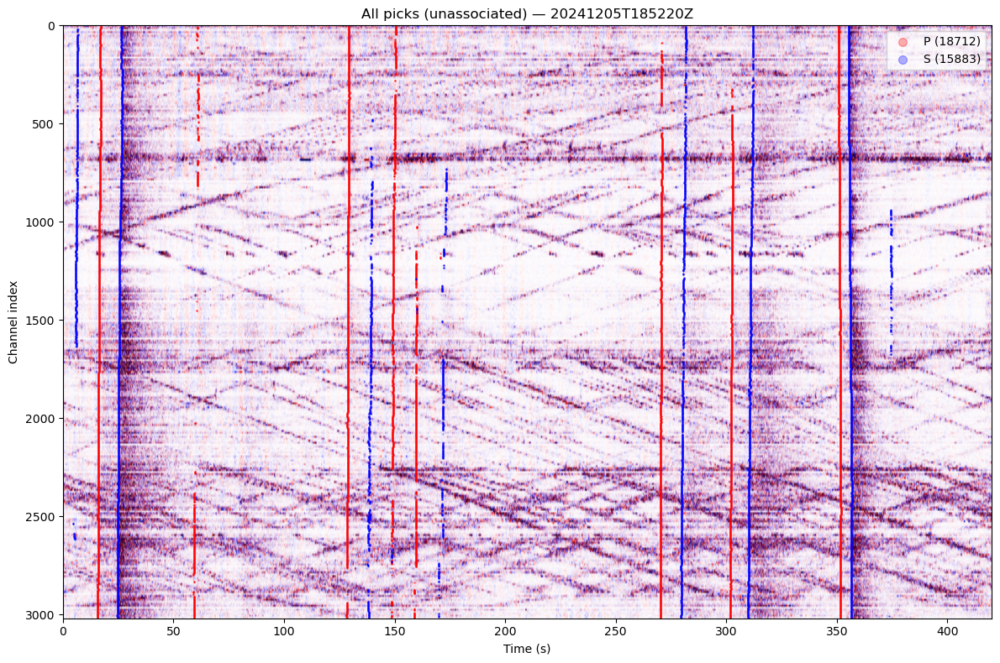

In [4]:
# Visualize all picks (before association)
fig, ax = plt.subplots(figsize=(12, 8))
vmax = 2 * np.percentile(np.abs(data), 95)
plot_das(ax, data, nx, nt, dt_s, cmap="seismic", vmin=-vmax, vmax=vmax)

p_picks = df[df["phase_type"] == "P"]
s_picks = df[df["phase_type"] == "S"]
ax.scatter(p_picks["phase_index"] * dt_s, p_picks["channel_index"].astype(int),
           s=0.5, c="red", alpha=0.3, label=f"P ({len(p_picks)})")
ax.scatter(s_picks["phase_index"] * dt_s, s_picks["channel_index"].astype(int),
           s=0.5, c="blue", alpha=0.3, label=f"S ({len(s_picks)})")

ax.set_xlabel("Time (s)")
ax.set_ylabel("Channel index")
ax.set_title(f"All picks (unassociated) — {EVENT_ID}")
ax.legend(loc="upper right", markerscale=10)
plt.tight_layout()
plt.show()

## 2. P-S Pairing

The first step is to pair P and S picks on the same channel. For each P pick, we find the first S pick that follows within a maximum P-S time window. This exploits the physical constraint that S-waves always arrive after P-waves.

From each P-S pair, we estimate the earthquake origin time using the Wadati relation:

$$t_0 = \frac{t_P + t_S}{2} - \frac{t_S - t_P}{2} \cdot \frac{V_P/V_S + 1}{V_P/V_S - 1}$$

where $V_P/V_S \approx 1.73$ is the regional P-to-S velocity ratio.

In [5]:
# Convert pre-computed picks back to dict format for the pairing function
picks = df.to_dict("records")

# Pair P and S picks per channel
pairs = estimate_origins_from_ps_pairs(
    picks,
    dt_s=dt_s,
    vp_vs=1.73,         # regional Vp/Vs ratio
    min_ps_dt=1.0,      # minimum P-S time (seconds) to avoid false pairs
    max_ps_dt=30.0,     # maximum P-S time (seconds)
)

print(f"Found {len(pairs)} P-S pairs")
# Each pair: (channel_id, p_index, s_index, t0_seconds, weight, ps_center, ps_interval)

Found 13307 P-S pairs


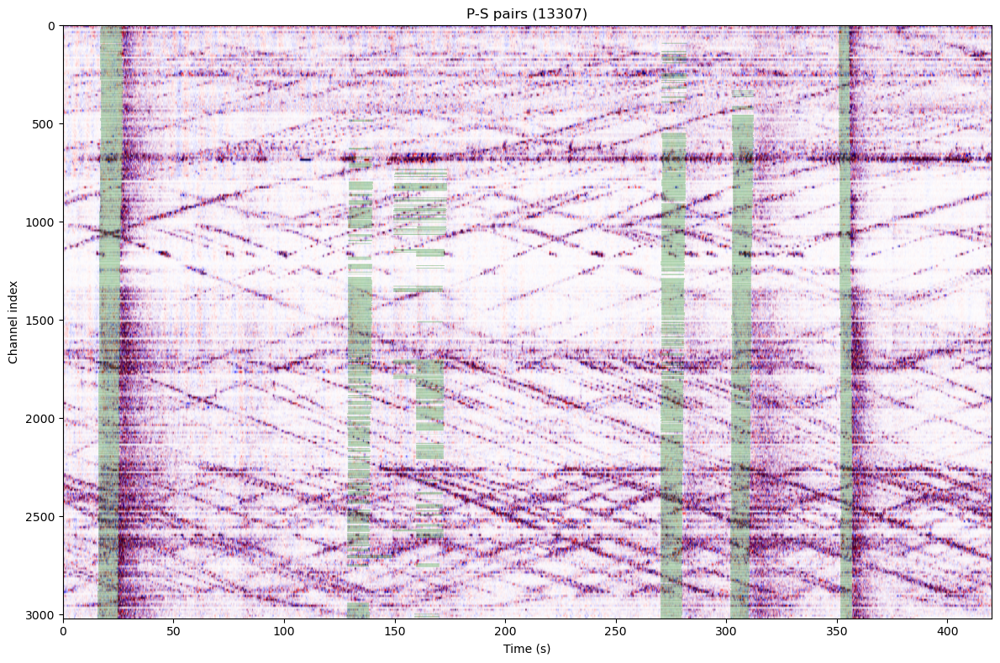

In [6]:
# Visualize P-S pairs on waveform
fig, ax = plt.subplots(figsize=(12, 8))
plot_das(ax, data, nx, nt, dt_s, cmap="seismic", vmin=-vmax, vmax=vmax)
for ch, p_idx, s_idx, t0, w, pc, pi in pairs:
    ch_int = int(ch)
    ax.plot([p_idx * dt_s, s_idx * dt_s], [ch_int, ch_int],
            c="green", alpha=0.1, lw=0.5)
ax.set_xlabel("Time (s)")
ax.set_ylabel("Channel index")
ax.set_title(f"P-S pairs ({len(pairs)})")
plt.tight_layout()
plt.show()

## 3. Origin Time Estimation

From each P-S pair, we estimate when the earthquake occurred (origin time):

$$t_0 = \frac{t_P + t_S}{2} - \frac{t_S - t_P}{2} \cdot \frac{V_P/V_S + 1}{V_P/V_S - 1}$$

If multiple P-S pairs from the **same earthquake** all produce similar origin times, we can detect that earthquake by finding **peaks in the histogram of estimated origin times**.

This is the core idea behind the association algorithm (Zhu et al. 2025; Song et al. 2026): cluster origin time estimates to identify discrete events.

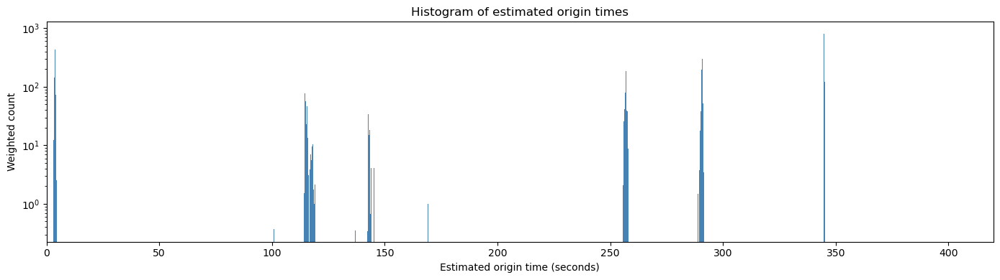

In [7]:
# Extract origin time estimates from pairs
t0_estimates = np.array([t0 for _, _, _, t0, _, _, _ in pairs])
weights = np.array([w for _, _, _, _, w, _, _ in pairs])

# Build weighted histogram of origin times
bin_size = 0.1  # seconds
t_max = nt * dt_s
hist_edges = np.arange(0, t_max + bin_size, bin_size)
hist_counts, _ = np.histogram(t0_estimates, bins=hist_edges, weights=weights)
bin_centers = (hist_edges[:-1] + hist_edges[1:]) / 2

fig, ax = plt.subplots(figsize=(14, 4))
ax.bar(bin_centers, hist_counts, width=bin_size, color="steelblue", edgecolor="none")
ax.set_xlabel("Estimated origin time (seconds)")
ax.set_ylabel("Weighted count")
ax.set_title("Histogram of estimated origin times")
ax.set_xlim(0, t_max)
ax.set_yscale("log")
plt.tight_layout()
plt.show()

In [8]:
# Run full association: pair → histogram → peak detection → link picks to events
assoc = associate_picks(
    pairs,
    nt=nt,
    dt_s=dt_s,
    bin_size=0.1,          # histogram bin width (seconds)
    mph=100,               # minimum peak height
    mpd=50,                # minimum peak distance (bins)
    origin_window=0.5,     # max distance from peak to link a pair (seconds)
    moveout_window=0.5,    # RANSAC residual threshold (seconds)
)

print(f"Detected {len(assoc.event_times)} events")
print(f"Event origin times: {[f'{t:.1f}s' for t in assoc.event_times]}")
print(f"Associated picks: {len(assoc.pick_to_event)} / {len(picks)}")

Detected 6 events
Event origin times: ['3.8s', '114.7s', '142.8s', '257.1s', '290.8s', '345.0s']
Associated picks: 22418 / 34595


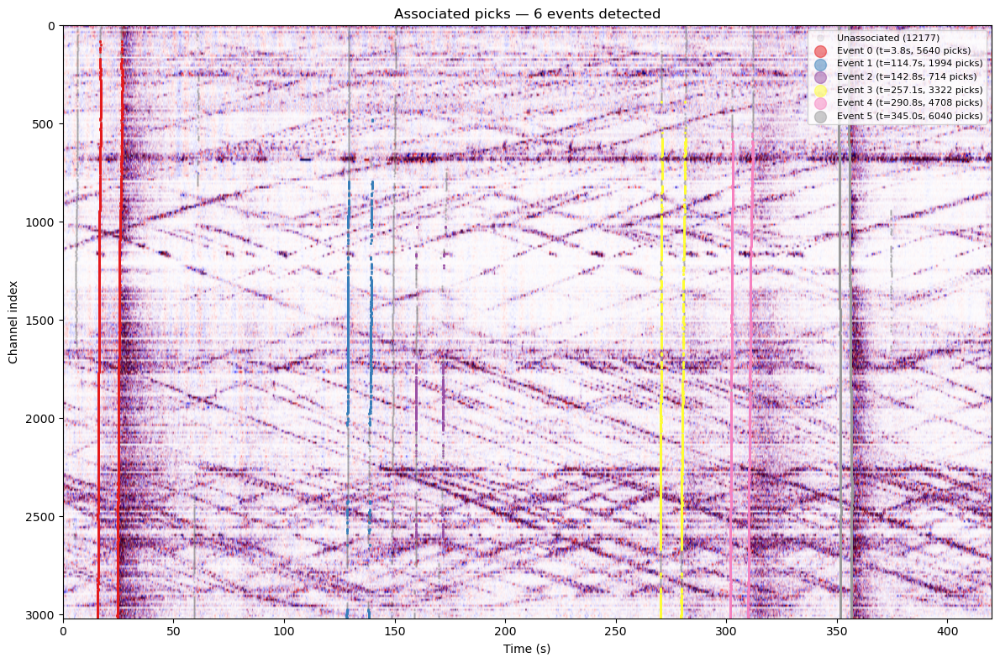

In [9]:
# Visualize association results
fig, ax = plt.subplots(figsize=(12, 8))
plot_das(ax, data, nx, nt, dt_s, cmap="seismic", vmin=-vmax, vmax=vmax)

colors = plt.cm.Set1(np.linspace(0, 1, max(len(assoc.event_times), 1)))

unassoc_mask = df.apply(
    lambda r: (r["channel_index"], int(r["phase_index"]), r["phase_type"]) not in assoc.associated_set,
    axis=1,
)
unassoc = df[unassoc_mask]
ax.scatter(unassoc["phase_index"] * dt_s, unassoc["channel_index"].astype(int),
           s=0.3, c="gray", alpha=0.1, label=f"Unassociated ({len(unassoc)})")

for eid, t_origin in enumerate(assoc.event_times):
    event_picks = [(ch, idx, ptype) for (ch, idx, ptype), e in assoc.pick_to_event.items() if e == eid]
    if not event_picks:
        continue
    chs = [int(ch) for ch, _, _ in event_picks]
    idxs = [idx * dt_s for _, idx, _ in event_picks]
    ax.scatter(idxs, chs, s=1, c=[colors[eid % len(colors)]], alpha=0.5,
               label=f"Event {eid} (t={t_origin:.1f}s, {len(event_picks)} picks)")

ax.set_xlabel("Time (s)")
ax.set_ylabel("Channel index")
ax.set_title(f"Associated picks — {len(assoc.event_times)} events detected")
ax.legend(loc="upper right", markerscale=10, fontsize=8)
plt.tight_layout()
plt.show()

## 4. Event Head Detection

PhaseNet-DAS+ (Zhu et al. 2025a) includes an **event detection head** that directly predicts where earthquakes occur in the spatiotemporal domain. This provides an alternative to purely pick-based association.

The event head outputs a probability map of event centers — peaks in this map indicate likely earthquake locations. These can be used to:
1. Provide initial event locations for phase association
2. Detect events that have too few picks for reliable P-S pairing
3. Improve association in windows with overlapping events

In [10]:
# Let's compare: single-event window vs multi-event window
# Strong single event
SINGLE_EVENT = "20230106T122215Z"
single_path = hf_hub_download(
    HF_REPO, f"arcata/phasenet_das/picks/{SINGLE_EVENT}.parquet",
    repo_type="dataset", local_dir="data/quakeflow_das",
)
df_single = pd.read_parquet(single_path)

n_origins_single = df_single[df_single["origin_id"] >= 0]["origin_id"].nunique()
n_origins_multi = df[df["origin_id"] >= 0]["origin_id"].nunique()

print(f"Single-event window ({SINGLE_EVENT}): {n_origins_single} origin(s), "
      f"{(df_single['origin_id'] >= 0).sum()} associated picks")
print(f"Multi-event window ({EVENT_ID}): {n_origins_multi} origin(s), "
      f"{(df['origin_id'] >= 0).sum()} associated picks")

Single-event window (20230106T122215Z): 3 origin(s), 18344 associated picks
Multi-event window (20241205T185220Z): 6 origin(s), 15734 associated picks


## 5. Tune Parameters

The association has several key parameters. Let's explore how `mph` (minimum peak height) and `origin_window`/`moveout_window` affect the results:

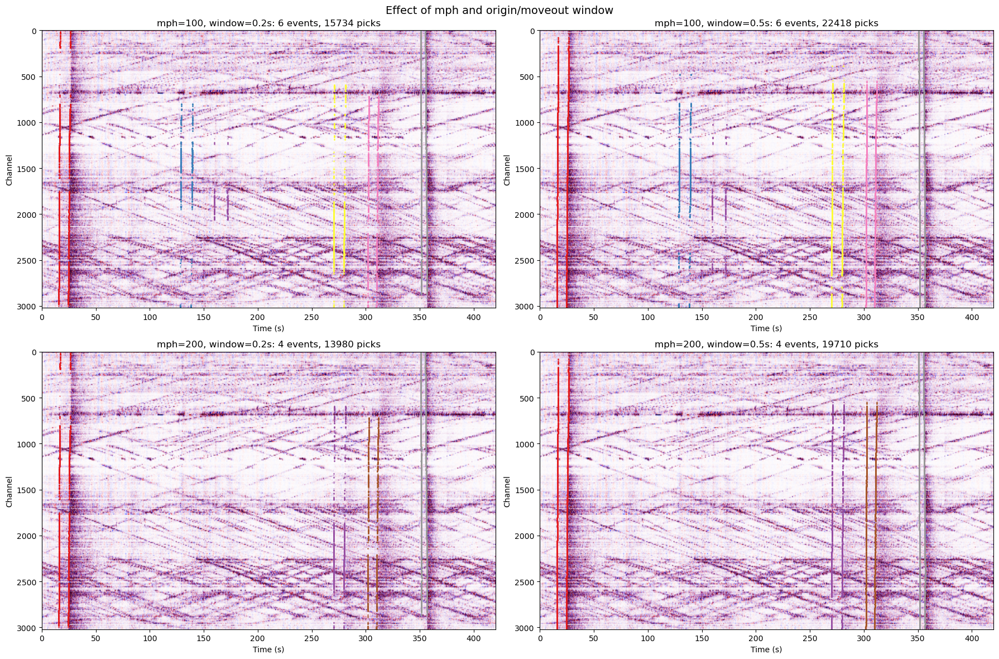

In [11]:
# Compare: mph and origin/moveout window
configs = [
    {"mph": 100, "origin_window": 0.2, "moveout_window": 0.2},
    {"mph": 100, "origin_window": 0.5, "moveout_window": 0.5},
    {"mph": 200, "origin_window": 0.2, "moveout_window": 0.2},
    {"mph": 200, "origin_window": 0.5, "moveout_window": 0.5},
]

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

for ax, cfg in zip(axes.flat, configs):
    assoc_test = associate_picks(
        pairs, nt=nt, dt_s=dt_s,
        bin_size=0.1, mph=cfg["mph"], mpd=50,
        origin_window=cfg["origin_window"],
        moveout_window=cfg["moveout_window"],
    )
    n_events = len(assoc_test.event_times)
    n_assoc = len(assoc_test.pick_to_event)

    plot_das(ax, data, nx, nt, dt_s, cmap="seismic", vmin=-vmax, vmax=vmax)

    colors_t = plt.cm.Set1(np.linspace(0, 1, max(n_events, 1)))
    for eid in range(n_events):
        event_picks = [(ch, idx, pt) for (ch, idx, pt), e in assoc_test.pick_to_event.items() if e == eid]
        if event_picks:
            chs = [int(ch) for ch, _, _ in event_picks]
            idxs = [idx * dt_s for _, idx, _ in event_picks]
            ax.scatter(idxs, chs, s=0.5, c=[colors_t[eid % len(colors_t)]], alpha=0.5)

    ax.set_title(f"mph={cfg['mph']}, window={cfg['origin_window']}s: "
                 f"{n_events} events, {n_assoc} picks")
    ax.set_xlabel("Time (s)")
    ax.set_ylabel("Channel")

plt.suptitle("Effect of mph and origin/moveout window", fontsize=14)
plt.tight_layout()
plt.show()

## Summary

The association pipeline:
1. **P-S pairing** — match P and S picks on the same channel within a time window
2. **Origin estimation** — compute origin time from each pair using the Wadati relation
3. **Histogram clustering** — bin origin time estimates, find peaks → one peak per event
4. **Pick linking** — assign each pair to the nearest peak within `origin_window`
5. **RANSAC moveout fitting** — fit the P-S midpoint moveout curve using RANSAC (Zhu et al. 2025b) to reject outlier pairs that don't follow a consistent moveout pattern. The `moveout_window` parameter controls the maximum RANSAC residual.

Key parameters to tune:
- `mph`: trade-off between detecting weak events vs false detections
- `origin_window`: how tightly pairs must cluster around a detected origin time
- `moveout_window`: RANSAC residual threshold for moveout consistency

This simple histogram-based approach works well for single DAS arrays. For seismic networks with multiple stations, more sophisticated methods are needed: GaMMA (Zhu et al. 2022) uses a Bayesian Gaussian mixture model, while VoRA (Song et al. 2026) uses Voronoi tessellation for scalable association. The origin time estimation from P-S pairs is the fundamental building block shared across all these methods.

**Next:** [Lab 2c](lab2c_semisupervised_training.ipynb) shows how associated picks become training labels for iteratively improving the PhaseNet-DAS model.